In [1]:
!git clone https://github.com/m-zayan/ml_utils.git

!pip install memory-profiler

Cloning into 'ml_utils'...
remote: Enumerating objects: 15, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 15 (delta 1), reused 11 (delta 0), pack-reused 0
Unpacking objects: 100% (15/15), done.
  Created wheel for memory-profiler: filename=memory_profiler-0.57.0-cp36-none-any.whl size=28995 sha256=a6889d9b89c08853e1fc441a0a7ba097f9eed1fad9f1e2867baa93edcb0b3e7a
  Stored in directory: /root/.cache/pip/wheels/74/20/b5/20964ef97be73d2c3a695c9cad7bccd96d1e3e737a8163861f
Successfully built memory-profiler


In [2]:
%load_ext memory_profiler

import sys

import gc

sys.path.insert(0, './ml_utils')

from ml_utils.plots import Animation2D
from ml_utils.dataset import Load
from ml_utils.requests_utils.data_request import Writer


url = 'https://datahub.io/machine-learning/mnist_784/r/mnist_784.csv'
fname = 'mnist.csv'

Writer.download_from_url(url, to_path=f'./{fname}', chunk_size=1024)

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from scipy.sparse import csr_matrix, bsr_matrix, eye as sr_eye, linalg as sr_linalg

"""
m = no. of rows (training examples)
n = no. of cols (features)
n_classes = no. of classes

Input shape -->  (X) = (m,n) 
Output (label) shape --> (Y) = (m,n_classes)

weight = (n , n_classes)
b = (1 , n_classes)
"""

print()

loader = Load(dtype='numpy')

random_state = 42

In [4]:
def collect(trials=5):

  while trials and gc.collect():
    
    gc.collect()
    trials -= 1

In [5]:
def one_hot_encoding(y, classes):

  encoded = (y.reshape(-1, 1) == classes).astype('float32')

  return csr_matrix(encoded)


def load_mnist(test_size=0.1):

  global n_classes, n, x_train, y_train, x_test, y_test, m_train, m_test, theta, b, I
  
  data = pd.read_csv(f'./mnist.csv')

  classes = np.unique(data['class'])
  n_classes = len(classes)

  m, n = data.shape
  n -= 1

  test_size = int(test_size * m)

  train = data.sample(n=m - test_size, random_state=random_state)
  test = data.drop(train.index).sample(frac=1)

  train = train.reset_index(drop=True).to_numpy().astype('float32')
  test = test.reset_index(drop=True).to_numpy().astype('float32')

  train[:, :-1] /= 255.0
  test[:, :-1] /= 255.0

  x_train, y_train, x_test, y_test = bsr_matrix(train[:, :-1]), one_hot_encoding(train[:, -1], classes), test[:, :-1], test[:, -1]

  m_train, m_test = len(train), len(test)

  print('=' * 50)

  print('x_train - Compression : %.2f'%(1.0 - x_train.count_nonzero() / (m_train * n)))
  print('y_train - Compression : %.2f'%(1.0 - y_train.count_nonzero() / (m_train * n_classes)))

  print('=' * 50)

  print('dim(x_train) :', x_train.shape)
  print('dim(y_train) :', y_train.shape)

In [6]:
def load_iris(test_size=0.1):

  global n_classes, n, x_train, y_train, x_test, y_test, m_train, m_test
  
  data = loader.load_train_test(dname='iris', test_size=test_size, random_state=random_state)
  
  x_train, y_train = data['train']
  
  x_test, y_test = data['test']
  y_test = y_test.squeeze()
  
  m_train, m_test = len(x_train), len(x_test)
  n = x_train.shape[-1]

  classes = np.array([0.0, 1.0, 2.0])
  n_classes = 3

  x_train, y_train = bsr_matrix(x_train), one_hot_encoding(y_train, classes)

  print('=' * 50)

  print('x_train - Compression : %.2f'%(1.0 - x_train.count_nonzero() / (m_train * n)))
  print('y_train - Compression : %.2f'%(1.0 - y_train.count_nonzero() / (m_train * n_classes)))

  print('=' * 50)

  print('dim(x_train) :', x_train.shape)
  print('dim(y_train) :', y_train.shape)

In [7]:
%memit

try:

  del classes, n, x_train, y_train, x_test, y_test, theta, b
  collect(10)

except:
  
  pass
  
load_iris(test_size=0.1)

peak memory: 143.62 MiB, increment: 0.04 MiB
{'Name': 'IRIS', 'n_samples': 150, 'n_features': 4}
x_train - Compression : 0.00
y_train - Compression : 0.67
dim(x_train) : (135, 4)
dim(y_train) : (135, 3)


In [8]:
def init_params():

  global theta, b, I
  
  theta = np.zeros((n, n_classes), dtype='float32')
  b = np.zeros((1, n_classes), dtype='float32')

  # used for - computing hessian
  I = sr_eye(m_train, m_train)

In [9]:
def hypothesis(X, theta, b):

  h = X.dot(theta) + b
  
  return csr_matrix(h)

In [10]:
def softmax(z):
  
  a = z.toarray()

  a = np.exp(a)
  a_sum = np.sum(a, axis=-1, keepdims=True)
  
  return csr_matrix(a / a_sum)

In [11]:
def multinomial_loss(A , Y):
  
  a = A.toarray()
  y = Y.toarray()

  log_0 = - y * np.log(a) 
  log_1 = - (1 - y) * np.log(1 - a)

  loss = (log_0 + log_1).mean()
  
  return loss

In [12]:
def gradient_dir(X, Y, A, theta, b):
  
  dJ = (A - Y) * (1.0 / m_train)

  dtheta = X.transpose().dot(dJ)
  db = dJ.sum(axis=0)

  return dtheta, db

def compute_hessian_inv(A):
  
  da = csr_matrix(A.toarray() * (1.0 - A.toarray()))
  H_inv = np.zeros((n, n, n_classes))

  for i in range(n_classes):
    
    d = I.multiply(da[:, i])
    d = x_train.transpose().dot(d)
    d = d.dot(x_train.toarray())

    h_inv = np.linalg.inv(d)

    H_inv[:, :, i] = h_inv

  return H_inv.sum(axis=-1)

def newton_dir(X, Y, A, theta, b):
  
  dtheta, _ = gradient_dir(X, Y, A, theta, b) 
  dtheta = dtheta.toarray()

  try:
  
    H_inv = compute_hessian_inv(A)

  except:
    
    print('Hessian is not invariable, updating: dtheta=gradient_dir(...)')

    return dtheta

  return H_inv.T @ dtheta

# Gradient Descent

In [13]:
def gradient_descent(theta, b, n_iter=10, lr=0.0001, tol=1e-5):

  cost = []

  for i in range(n_iter):

    z = hypothesis(x_train, theta, b)
    a = softmax(z)

    J = multinomial_loss(a, y_train)

    if i % 100 == 0 or i == n_iter - 1:

      print(f'iter - {i + 1}, loss = %f'%J)

    if i > 0 and cost[-1] - J < tol:
      
      if cost[-1] < J:
      
        print(f'Algorithm diverged at: n_iter = {i}')
      
      else:

        print(f'Algorithm converged at: n_iter = {i}')
      
      break

    dtheta, db = gradient_dir(x_train, y_train, a, theta, b)

    theta = theta - lr * dtheta
    b = b - lr * db

    cost.append(J)
  
  
  def predict(x_test):

    z = hypothesis(x_test, theta, b)
    a = softmax(z)
    a = a.toarray()
    
    return a.argmax(axis=-1)
  
  def get_coeff():

    return theta, b

  cost = np.array(cost)
  
  return cost, predict, get_coeff

In [14]:
%memit

init_params()

g_cost, predict, get_coeff = gradient_descent(theta, b, n_iter=500, lr=0.01, tol=1e-12)

peak memory: 143.99 MiB, increment: 0.00 MiB
iter - 1, loss = 0.636514
iter - 101, loss = 0.435438
iter - 201, loss = 0.366527
iter - 301, loss = 0.330687
iter - 401, loss = 0.307038
iter - 500, loss = 0.289423


In [15]:
# test

y_pred = predict(x_test)
acc = np.sum(y_test == y_pred) / m_test

print('Accuracy : %.2f'%acc)

Accuracy : 0.87


# Newton Method

In [16]:
def newton_method(theta, b, n_iter=10, lr=0.0001, tol=1e-5):

  cost = []

  for i in range(n_iter):

    z = hypothesis(x_train, theta, b)
    a = softmax(z)

    J = multinomial_loss(a, y_train)

    if i % 100 == 0 or i == n_iter - 1:

      print(f'iter - {i + 1}, loss = %f'%J)

    if i > 0 and cost[-1] - J < tol:
      
      if cost[-1] < J:
      
        print(f'Algorithm diverged at: n_iter = {i}')
      
      else:

        print(f'Algorithm converged at: n_iter = {i}')
      
      break

    q_step = newton_dir(x_train, y_train, a, theta, b)

    theta = theta - lr * q_step

    cost.append(J)
  
  
  def predict(x_test):

    z = hypothesis(x_test, theta, b)
    a = softmax(z)
    a = a.toarray()
    
    return a.argmax(axis=-1)
  
  def get_coeff():

    return theta, b

  cost = np.array(cost)

  return cost, predict, get_coeff

In [17]:
%memit

init_params()

n_cost, predict, get_coeff = newton_method(theta, b, n_iter=300, lr=1.0, tol=1e-12)

peak memory: 145.16 MiB, increment: 0.00 MiB
iter - 1, loss = 0.636514
iter - 101, loss = 0.173824
iter - 201, loss = 0.081486
iter - 300, loss = 0.056080


In [18]:
# x_test

y_pred = predict(x_test)
acc = np.sum(y_test == y_pred) / m_test

print('Accuracy : %.2f'%acc)

Accuracy : 0.93


# Gradient Descent vs Newton Raphson 

In [19]:
animator = Animation2D(plot_type='line')

In [20]:
g_iter = np.arange(len(g_cost)) # gradient descent
ne_iter = np.arange(len(n_cost)) # newton raphson

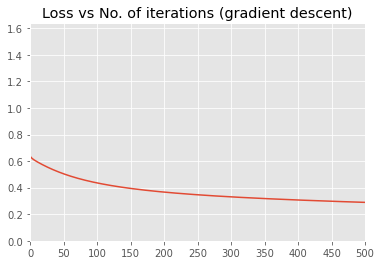

In [21]:
animator.play_animation(g_iter, g_cost, title='Loss vs No. of iterations (gradient descent)')

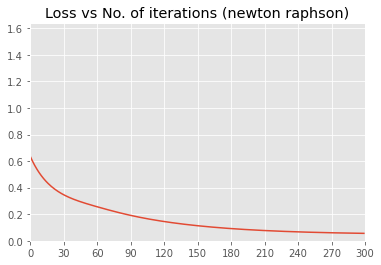

In [22]:
animator.play_animation(ne_iter, n_cost, title='Loss vs No. of iterations (newton raphson)')